<a href="https://colab.research.google.com/github/SofiaGom/RegresionNoLineal/blob/main/Act6_A01660774.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Actividad 6: Regresión No Lineal
##Sofía Gómez Torres

In [203]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.special as special
from scipy.optimize import curve_fit
import seaborn as sns
from sklearn.metrics import r2_score

In [204]:
#Carga desde un archivo .csv sin indice
abrir = pd.read_csv('/content/cuentas_credicel.csv', encoding="latin")
abrir.head(5)

<ipython-input-204-8b6bf59befc9>:2: DtypeWarning: Columns (30) have mixed types. Specify dtype option on import or set low_memory=False.
  abrir = pd.read_csv('/content/cuentas_credicel.csv', encoding="latin")


,folio,tag,folio_solicitud,fecha,marca,modelo,plazo,precio,enganche,descuento,...,porc_eng,limite_credito,semana_actual,cp_cliente,edad_cliente,cd_cliente,edo_cliente,cd_venta,edo_venta,curp
0,3,HDNAWQ3A,30,12/11/21 19:00,ZTE,Blade A3 2020 RO B,26S,1949.0,780.0,0.0,...,40.02,5000,26,NaN,23.0,0,0,Tantoyuca,Veracruz,AEVM980413MVZNDR02
1,4,M418YNR4,33,12/11/21 19:15,MOTOROLA,LTE XT2097-12 E7I POWER Azul,13S,2999.0,1050.0,0.0,...,35.01,6000,13,NaN,60.0,PUEBLA,PUE.,Heroica Puebla de Zaragoza,Puebla,ZALC610119MPLPRR07
2,5,SZ7V3NZT,37,13/11/21 14:13,ZTE,BLADE A3 2020 Gris,13S,1959.0,490.0,0.0,...,25.01,0,74,NaN,58.0,TANTOYUCA,VER.,0,0,0
3,6,9I08UIQZ,38,13/11/21 15:45,ZTE,BLADE A3 2020 Gris,13S,1959.0,490.0,0.0,...,25.01,7000,13,NaN,42.0,AMXTLAN PUE,NaN,Zacatlan,Puebla,SAMJ790115MPLNRS02
4,7,JMF4LKYU,44,13/11/21 16:10,MOTOROLA,G10 B,39S,4299.0,1075.0,0.0,...,25.01,7000,74,NaN,33.0,TANTOYUCA,VER.,Tantoyuca,Veracruz,TEHF880707HVZRRR07


In [205]:
abrir.shape

(22735, 39)

In [206]:
abrir.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22735 entries, 0 to 22734
Data columns (total 39 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   folio               22735 non-null  int64  
 1   tag                 22735 non-null  object 
 2   folio_solicitud     22735 non-null  int64  
 3   fecha               22735 non-null  object 
 4   marca               22735 non-null  object 
 5   modelo              22735 non-null  object 
 6   plazo               22735 non-null  object 
 7   precio              22735 non-null  float64
 8   enganche            22735 non-null  float64
 9   descuento           22735 non-null  float64
 10  semana              22735 non-null  int64  
 11  monto_financiado    22735 non-null  float64
 12  costo_total         22735 non-null  int64  
 13  monto_accesorios    22735 non-null  float64
 14  agente_venta        22735 non-null  object 
 15  dis_venta           22735 non-null  object 
 16  stat

#Nulos

In [207]:
nulos = abrir.copy()

In [208]:
nulos.isnull().sum()

folio                    0
tag                      0
folio_solicitud          0
fecha                    0
marca                    0
modelo                   0
plazo                    0
precio                   0
enganche                 0
descuento                0
semana                   0
monto_financiado         0
costo_total              0
monto_accesorios         0
agente_venta             0
dis_venta                0
status                   0
fraude                   0
empresa                 13
inversion                0
pagos_realizados         0
reautorizacion           0
fecha_ultimo_pago     3356
fecha_pago_proximo    3356
status_cuenta         3314
puntos                   0
riesgo                   0
score_buro               0
razones_buro          7340
porc_eng                 0
limite_credito           0
semana_actual            0
cp_cliente            7243
edad_cliente             9
cd_cliente               0
edo_cliente              8
cd_venta                 0
e

In [209]:
df = nulos.fillna(method = "bfill")
df = nulos.fillna(method = "ffill")
df = nulos.fillna(method = "bfill")

In [210]:
df.isnull().sum()

folio                  0
tag                    0
folio_solicitud        0
fecha                  0
marca                  0
modelo                 0
plazo                  0
precio                 0
enganche               0
descuento              0
semana                 0
monto_financiado       0
costo_total            0
monto_accesorios       0
agente_venta           0
dis_venta              0
status                 0
fraude                 0
empresa                0
inversion              0
pagos_realizados       0
reautorizacion         0
fecha_ultimo_pago      0
fecha_pago_proximo     0
status_cuenta         35
puntos                 0
riesgo                 0
score_buro             0
razones_buro           0
porc_eng               0
limite_credito         0
semana_actual          0
cp_cliente             0
edad_cliente           0
cd_cliente             0
edo_cliente            0
cd_venta               0
edo_venta              0
curp                   0
dtype: int64

In [211]:
df = df.drop('status_cuenta', axis=1)

In [212]:
df.isnull().sum().sum()

0

#Outliers

In [213]:
numericas = df.select_dtypes(include=['number'])
categoricas = df.select_dtypes(include=['object'])

In [214]:
def remove_outliers_iqr(df, column_name, threshold=1.5):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]
    return df

for column in numericas.columns:
    df = remove_outliers_iqr(df, column)

res = pd.concat([df, categoricas], axis = 1)

res.shape

(22735, 56)

In [215]:
numericas2 = res.select_dtypes(include=['number']).columns
df1 = res.dropna(subset=numericas2) #res que no tienen valores nulos en las columnas numéricas
df1

,folio,tag,folio_solicitud,fecha,marca,modelo,plazo,precio,enganche,descuento,...,fecha_ultimo_pago,fecha_pago_proximo,razones_buro,limite_credito,cp_cliente,cd_cliente,edo_cliente,cd_venta,edo_venta,curp
7243,7380.0,RU2XJKH3,27286.0,19/08/22 14:59,ZTE,BLADE A3 2020 Rojo,26S,2122.82,539.0,0.0,...,02/04/23 0:00,11/04/23 0:00,"F7,D7,J0,E2",3000,71981,LAS NEGRAS,OAX,Puerto Escondido,Oaxaca,LALB931006HOCZPR09
7247,7384.0,6MCSNDF8,27318.0,19/08/22 16:35,Samsung,A13,26S,5149.00,882.0,200.0,...,17/04/23 0:00,24/04/23 0:00,"F7,D7,J0,E2",6000,24732,CAMEPCHE,CAMP,Tenabo,Campeche,CAHN790722HCCRLC05
7250,7387.0,JJ6G3YBG,27352.0,19/08/22 17:31,NOKIA,C20 2+32GB AZUL B,13S,3040.83,847.0,0.0,...,03/09/22 0:00,11/09/22 0:00,"K0,J0,D7,E2",2750,72000,PUEBLA,PUE,Teziutlan,Puebla,PORD840306HPLNDV06
7254,7391.0,T9BANZI8,27375.0,19/08/22 19:11,Motorola,XT2167-1 MOTO G41,26S,4799.00,921.0,0.0,...,18/11/22 0:00,26/11/22 0:00,"K0,F7,D2,J0",4000,73300,CHIGNAHUAPAN,PUE,Zacatlan,Puebla,MEHR921109HPLNRL04
7255,7392.0,7WRXAJDS,27385.0,19/08/22 19:16,Samsung,A13,26S,5149.00,893.0,200.0,...,30/03/23 0:00,06/04/23 0:00,"K0,J0,E2,E0",5000,24900,CALKINI,CAMP,Calkini,Campeche,CAMB920904MYNSXT00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22721,22958.0,O02NOS0D,96477.0,18/04/23 17:04,Samsung,A04E,26S,3149.00,810.0,200.0,...,18/04/23 17:04,25/04/23 0:00,"K0,J0,D7,G1",5500,97430,MOTUL,YUC,Motul De Carrillo Puerto,Yucatan,SOEJ621227HYNLSV01
22722,22959.0,F43OIVKM,96463.0,18/04/23 17:05,MOTOROLA,MOTO G31,39S,4749.00,541.0,0.0,...,18/04/23 17:05,25/04/23 0:00,"K0,D7,J0,E2",10000,40080,IGUALA DE LA INDEPENDENCIA,GRO,Iguala De La Independencia,Guerrero,HEMR800620MGRRTS03
22727,22964.0,BVYCEU9N,96400.0,18/04/23 17:32,Motorola,Moto G51 5G,26S,5300.00,1325.0,0.0,...,18/04/23 17:32,25/04/23 0:00,"E2,E0,J0,P6",6000,73173,HUAUCHINANGO,PUE,Huauchinango,Puebla,BOGE940326MPLNNV09
22731,22968.0,NWB2EA8J,96479.0,18/04/23 18:46,Motorola,Moto E22i,26S,4100.00,1209.0,0.0,...,18/04/23 18:46,25/04/23 0:00,"K0,J0,D8,E2",5000,37295,LEON,GTO,Leon,Guanajuato,HEGB950620MGTRMN03


In [216]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6300 entries, 7243 to 22732
Data columns (total 56 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   folio               6300 non-null   float64
 1   tag                 6300 non-null   object 
 2   folio_solicitud     6300 non-null   float64
 3   fecha               6300 non-null   object 
 4   marca               6300 non-null   object 
 5   modelo              6300 non-null   object 
 6   plazo               6300 non-null   object 
 7   precio              6300 non-null   float64
 8   enganche            6300 non-null   float64
 9   descuento           6300 non-null   float64
 10  semana              6300 non-null   float64
 11  monto_financiado    6300 non-null   float64
 12  costo_total         6300 non-null   float64
 13  monto_accesorios    6300 non-null   float64
 14  agente_venta        6300 non-null   object 
 15  dis_venta           6300 non-null   object 
 16  st

In [217]:
df1.isnull().sum()

folio                 0
tag                   0
folio_solicitud       0
fecha                 0
marca                 0
modelo                0
plazo                 0
precio                0
enganche              0
descuento             0
semana                0
monto_financiado      0
costo_total           0
monto_accesorios      0
agente_venta          0
dis_venta             0
status                0
fraude                0
empresa               0
inversion             0
pagos_realizados      0
reautorizacion        0
fecha_ultimo_pago     0
fecha_pago_proximo    0
puntos                0
riesgo                0
score_buro            0
razones_buro          0
porc_eng              0
limite_credito        0
semana_actual         0
cp_cliente            0
edad_cliente          0
cd_cliente            0
edo_cliente           0
cd_venta              0
edo_venta             0
curp                  0
tag                   0
fecha                 0
marca                 0
modelo          

In [218]:
df1.fillna(method="ffill")
df1.fillna(method="bfill")

,folio,tag,folio_solicitud,fecha,marca,modelo,plazo,precio,enganche,descuento,...,fecha_ultimo_pago,fecha_pago_proximo,razones_buro,limite_credito,cp_cliente,cd_cliente,edo_cliente,cd_venta,edo_venta,curp
7243,7380.0,RU2XJKH3,27286.0,19/08/22 14:59,ZTE,BLADE A3 2020 Rojo,26S,2122.82,539.0,0.0,...,02/04/23 0:00,11/04/23 0:00,"F7,D7,J0,E2",3000,71981,LAS NEGRAS,OAX,Puerto Escondido,Oaxaca,LALB931006HOCZPR09
7247,7384.0,6MCSNDF8,27318.0,19/08/22 16:35,Samsung,A13,26S,5149.00,882.0,200.0,...,17/04/23 0:00,24/04/23 0:00,"F7,D7,J0,E2",6000,24732,CAMEPCHE,CAMP,Tenabo,Campeche,CAHN790722HCCRLC05
7250,7387.0,JJ6G3YBG,27352.0,19/08/22 17:31,NOKIA,C20 2+32GB AZUL B,13S,3040.83,847.0,0.0,...,03/09/22 0:00,11/09/22 0:00,"K0,J0,D7,E2",2750,72000,PUEBLA,PUE,Teziutlan,Puebla,PORD840306HPLNDV06
7254,7391.0,T9BANZI8,27375.0,19/08/22 19:11,Motorola,XT2167-1 MOTO G41,26S,4799.00,921.0,0.0,...,18/11/22 0:00,26/11/22 0:00,"K0,F7,D2,J0",4000,73300,CHIGNAHUAPAN,PUE,Zacatlan,Puebla,MEHR921109HPLNRL04
7255,7392.0,7WRXAJDS,27385.0,19/08/22 19:16,Samsung,A13,26S,5149.00,893.0,200.0,...,30/03/23 0:00,06/04/23 0:00,"K0,J0,E2,E0",5000,24900,CALKINI,CAMP,Calkini,Campeche,CAMB920904MYNSXT00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22721,22958.0,O02NOS0D,96477.0,18/04/23 17:04,Samsung,A04E,26S,3149.00,810.0,200.0,...,18/04/23 17:04,25/04/23 0:00,"K0,J0,D7,G1",5500,97430,MOTUL,YUC,Motul De Carrillo Puerto,Yucatan,SOEJ621227HYNLSV01
22722,22959.0,F43OIVKM,96463.0,18/04/23 17:05,MOTOROLA,MOTO G31,39S,4749.00,541.0,0.0,...,18/04/23 17:05,25/04/23 0:00,"K0,D7,J0,E2",10000,40080,IGUALA DE LA INDEPENDENCIA,GRO,Iguala De La Independencia,Guerrero,HEMR800620MGRRTS03
22727,22964.0,BVYCEU9N,96400.0,18/04/23 17:32,Motorola,Moto G51 5G,26S,5300.00,1325.0,0.0,...,18/04/23 17:32,25/04/23 0:00,"E2,E0,J0,P6",6000,73173,HUAUCHINANGO,PUE,Huauchinango,Puebla,BOGE940326MPLNNV09
22731,22968.0,NWB2EA8J,96479.0,18/04/23 18:46,Motorola,Moto E22i,26S,4100.00,1209.0,0.0,...,18/04/23 18:46,25/04/23 0:00,"K0,J0,D8,E2",5000,37295,LEON,GTO,Leon,Guanajuato,HEGB950620MGTRMN03


#Regresión no lineal

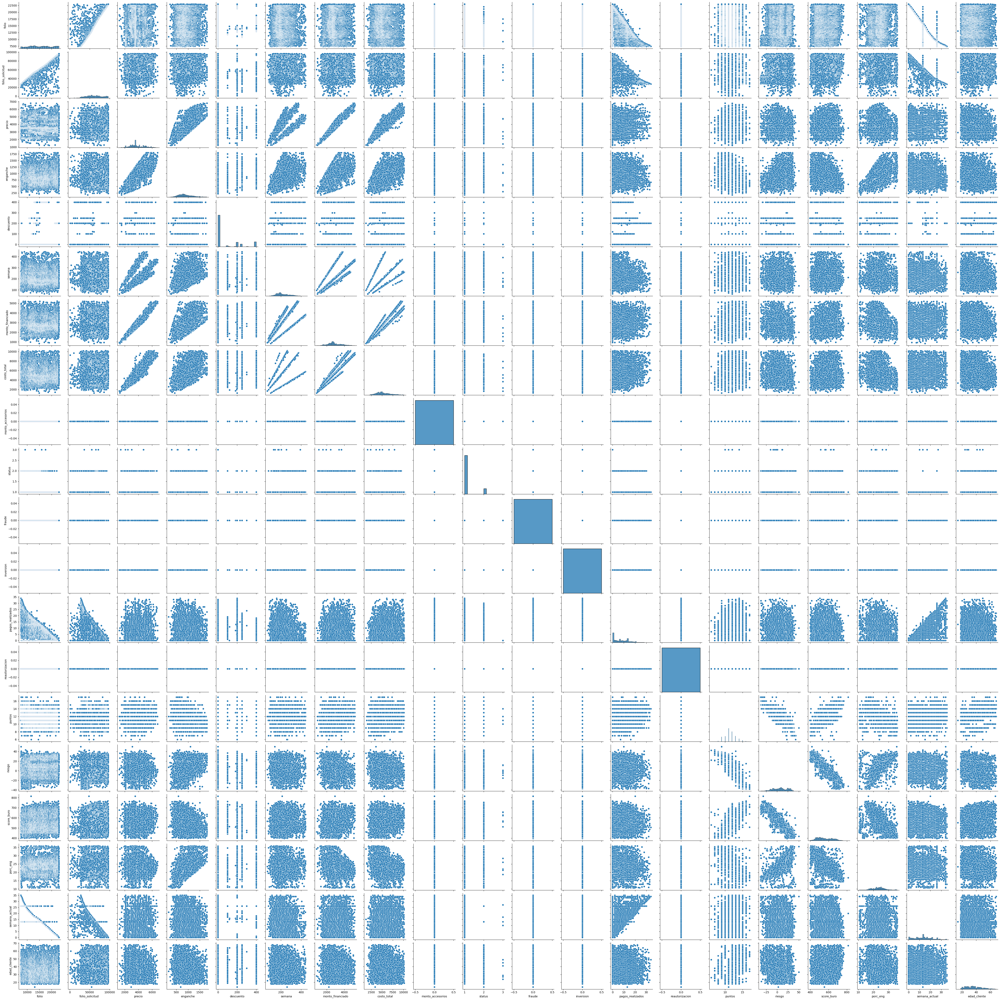

In [219]:
sns.pairplot(df)

#Riesgo (variable objetivo)

##Modelo 1: Función cuadrática

In [220]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
import numpy as np
Vars_Indep= df1[['riesgo']]
Var_Dep= df1['score_buro']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['riesgo'], df1['score_buro'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['riesgo'], df1['score_buro'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*x**2 + b*x +c

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [ 6.26154206e-03 -4.49739252e+00  5.85218185e+02]
Las predicciones son: 


,riesgo
7243,460.059759
7247,589.721839
7250,419.343683
7254,493.534282
7255,536.504514
...,...
22721,565.328783
22722,466.482848
22727,569.554015
22731,502.028144


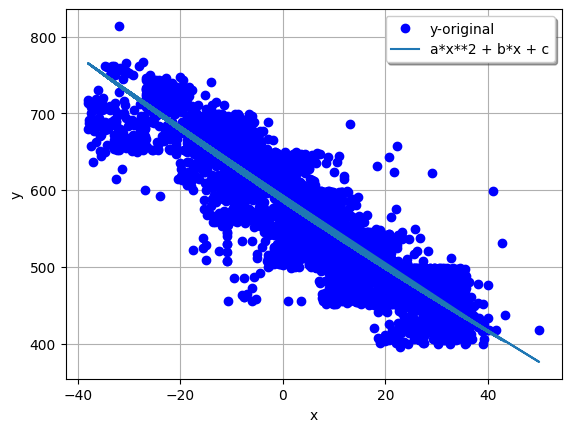

In [221]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x**2 + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()


In [222]:
#Calculamos el coeficiente de determinación del modelo
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  0.8372980727825019
La raiz del coefiente es:  0.9150399296109989


In [223]:
df_cor = pd.DataFrame(columns=['Variable', 'Modelo', 'Determinación', 'Correlación'])

In [224]:
df_cor.loc[0] = ['Riesgo', 'Modelo 1', round(R2,2), round(corr,2)]

#Modelo 2: Función inversa

In [225]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
import numpy as np
Vars_Indep= df1[['monto_financiado']]
Var_Dep= df1['riesgo']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a):
     return 1/a*x

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['monto_financiado'], df1['riesgo'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['monto_financiado'], df1['riesgo'])
a = parametros[ 0 ]
yfit1 = 1/a*x

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [522.70056134]
Las predicciones son: 


,monto_financiado
7243,3.030071
7247,8.163374
7250,4.197107
7254,7.419162
7255,8.142329
...,...
22721,4.474837
22722,8.050498
22727,7.604736
22731,5.530891


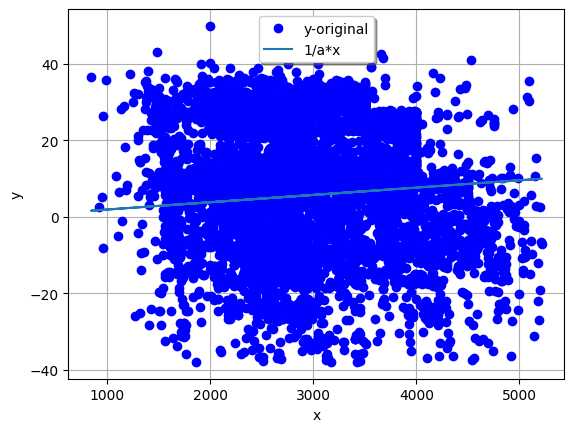

In [226]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [227]:
#Calculamos el coeficiente de determinación del modelo
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -0.03675867059766813
La raiz del coefiente es:  0.19172550846892578


In [228]:
df_cor.loc[1] = ['Riesgo', 'Modelo 2', round(R2,2), round(corr,2)]

#Modelo 3: Función senoidal

In [229]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df1[['riesgo']]
Var_Dep= df1['fraude']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a,b):
     return a*np.sin(x) + b

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['riesgo'], df1['fraude'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['riesgo'], df1['fraude'])
a,b = parametros[ 0 ], parametros[1]
yfit1 = a*np.sin(x) + b

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1


Los parámetros son:  [5.e-324 0.e+000]
Las predicciones son: 


,riesgo
7243,-4.940656e-324
7247,-4.940656e-324
7250,4.940656e-324
7254,4.940656e-324
7255,-4.940656e-324
...,...
22721,-4.940656e-324
22722,4.940656e-324
22727,0.000000e+00
22731,0.000000e+00


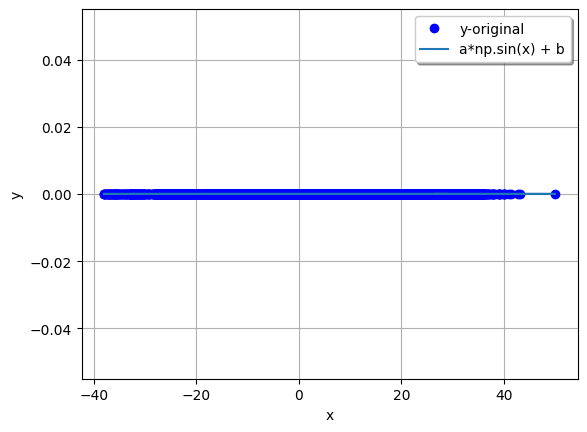

In [230]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.sin(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [231]:
#Calculamos el coeficiente de determinación del modelo
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  1.0
La raiz del coefiente es:  1.0


In [232]:
df_cor.loc[2] = ['Riesgo', 'Modelo 3', round(R2,2), round(corr,2)]

#Modelo 4: Función lineal con producto de coeficientes

In [233]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df1[['riesgo']]
Var_Dep= df1['puntos']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a,b,c):
     return a*x + b*x + c*x

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['riesgo'], df1['puntos'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['riesgo'], df1['puntos'])
a,b ,c= parametros[ 0 ], parametros[1], parametros[2]
yfit1 = a*x + b*x + c*x

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [-70.65643136 -70.65641776 141.47887916]
Las predicciones son: 


,riesgo
7243,4.814871
7247,-0.166030
7250,6.475172
7254,3.486631
7255,1.826330
...,...
22721,0.738834
22722,4.557525
22727,0.581105
22731,3.154571


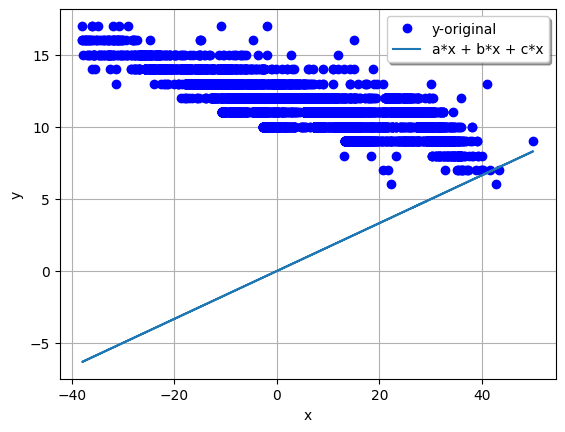

In [234]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x + b*x + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [235]:
#Calculamos el coeficiente de determinación del modelo
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -47.08285343904365
La raiz del coefiente es:  6.861694647756023


In [236]:
df_cor.loc[3] = ['Riesgo', 'Modelo 4', round(R2,2), round(corr,2)]

#Modelo 5: Función cuadrática inversa

In [237]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df1[['riesgo']]
Var_Dep= df1['pagos_realizados']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a):
     return 1/a*x**2

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['riesgo'], df1['pagos_realizados'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['riesgo'], df1['pagos_realizados'])
a = parametros[ 0 ]
yfit1 = 1/a*x**2

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [90.00318942]
Las predicciones son: 


,riesgo
7243,9.344113
7247,0.011111
7250,16.899401
7254,4.899826
7255,1.344397
...,...
22721,0.220020
22722,8.371953
22727,0.136106
22731,4.010969


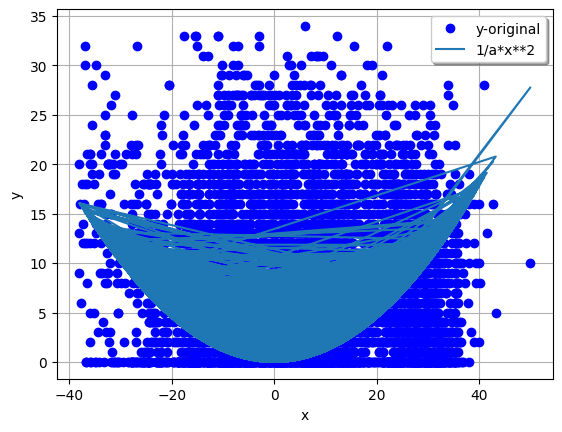

In [238]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [239]:
#Calculamos el coeficiente de determinación del modelo
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -0.8042139298709818
La raiz del coefiente es:  0.8967797554979605


In [240]:
df_cor.loc[4] = ['Riesgo', 'Modelo 5', round(R2,2), round(corr,2)]

#Variable 2: Score_buro (variable objetivo)

#Modelo 6

In [241]:
Vars_Indep= df1[['score_buro']]
Var_Dep= df1['porc_eng']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b, c):
     return a*np.abs(x) + b*x + c

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['score_buro'], df1['porc_eng'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['score_buro'], df1['porc_eng'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = (a*x**10 + b)/ c*x

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [-100.01663527   99.98352214   41.84845628]
Las predicciones son: 


,score_buro
7243,-1.288508e+31
7247,-1.794036e+31
7250,-9.752022e+28
7254,-1.721948e+30
7255,-8.205602e+30
...,...
22721,-4.931922e+30
22722,-7.279197e+29
22727,-1.856579e+31
22731,-1.219365e+30


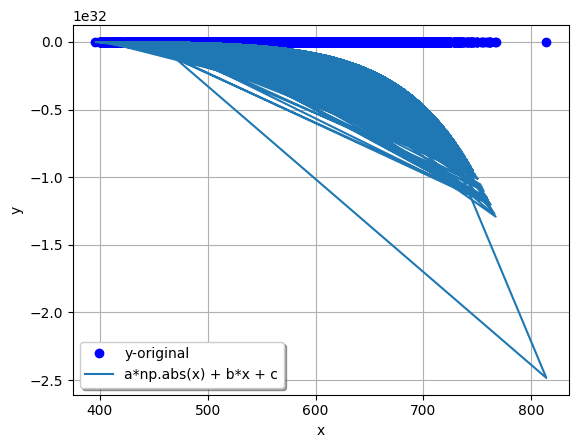

In [242]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.abs(x) + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()


In [243]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -1.8135711210529647e+61
La raiz del coefiente es:  4.258604373562969e+30


In [244]:
df_cor.loc[5] = ['Score_buro', 'Modelo 6', round(R2,2), round(corr,2)]

#Modelo 7: Función cuadrática

In [245]:
Vars_Indep= df1[['costo_total']]
Var_Dep= df1['score_buro']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['costo_total'], df1['score_buro'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['costo_total'], df1['score_buro'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*x**2 + b*x + c

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [ 1.13026529e-06 -7.63589874e-03  5.62874475e+02]
Las predicciones son: 


,costo_total
7243,550.280922
7247,570.799395
7250,549.986672
7254,564.545330
7255,570.799395
...,...
22721,550.764043
22722,586.315505
22727,566.059786
22731,553.730175


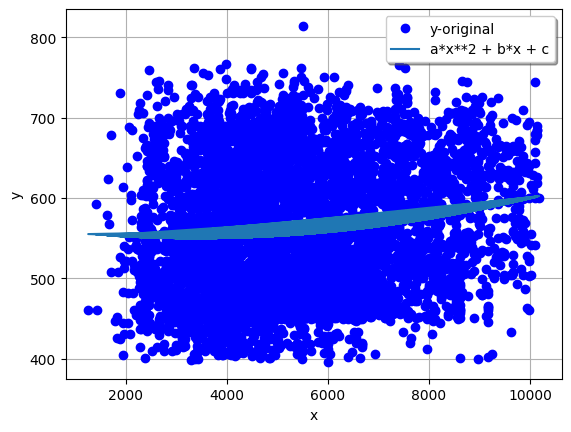

In [246]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x**2 + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [247]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  0.016626209546154347
La raiz del coefiente es:  0.12894265991577167


In [248]:
df_cor.loc[6] = ['Score_buro', 'Modelo 7', round(R2,2), round(corr,2)]

#Modelo 8: Función inversa

In [249]:
Vars_Indep= df1[['score_buro']]
Var_Dep= df1['monto_financiado']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a):
     return 1/a*x

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['score_buro'], df1['monto_financiado'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['score_buro'], df1['monto_financiado'])
a = parametros[ 0 ]
yfit1 = 1/a*x

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [0.19598773]
Las predicciones son: 


,score_buro
7243,3173.668073
7247,3270.612917
7250,2035.841738
7254,2643.022607
7255,3046.109067
...,...
22721,2908.345340
22722,2444.030558
22727,3280.817638
22731,2561.384843


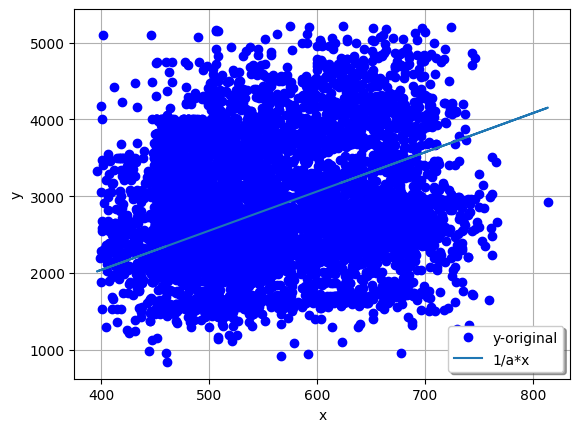

In [250]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [251]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -0.14972631357573607
La raiz del coefiente es:  0.38694484565081894


In [252]:
df_cor.loc[7] = ['Score_buro', 'Modelo 8', round(R2,2), round(corr,2)]

#Modeo 9: Función senoidal

In [253]:
Vars_Indep= df1[['score_buro']]
Var_Dep= df1['monto_accesorios']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b):
     return a*np.sin(x) + b

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['score_buro'], df1['monto_accesorios'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['score_buro'], df1['monto_accesorios'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.sin(x) + b

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [-1.e-323  5.e-324]
Las predicciones son: 


,score_buro
7243,4.940656e-324
7247,4.940656e-324
7250,4.940656e-324
7254,0.000000e+00
7255,4.940656e-324
...,...
22721,1.482197e-323
22722,-4.940656e-324
22727,-4.940656e-324
22731,9.881313e-324


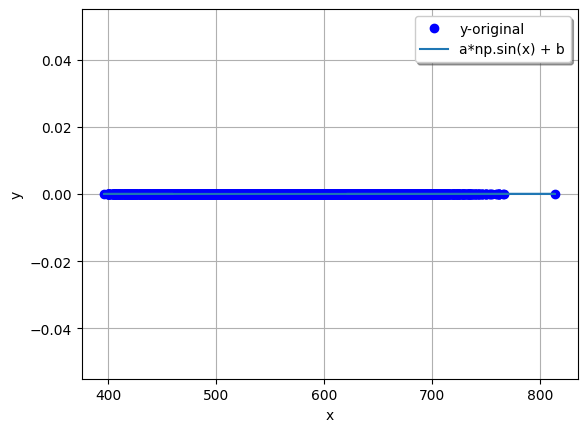

In [254]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.sin(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [255]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  1.0
La raiz del coefiente es:  1.0


In [256]:
df_cor.loc[8] = ['Score_buro', 'Modelo 9', round(R2,2), round(corr,2)]

#Modelo 10: Función cuadrática intensa

In [257]:
Vars_Indep= df1[['score_buro']]
Var_Dep= df1['semana']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a):
     return 1/a*x**2

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['score_buro'], df1['semana'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['score_buro'], df1['semana'])
a= parametros[ 0 ]
yfit1 = 1/a*x**2

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [1555.30407712]
Las predicciones son: 


,score_buro
7243,248.751357
7247,264.180494
7250,102.360048
7254,172.521891
7255,229.157118
...,...
22721,208.898057
22722,147.521635
22727,265.831618
22731,162.028766


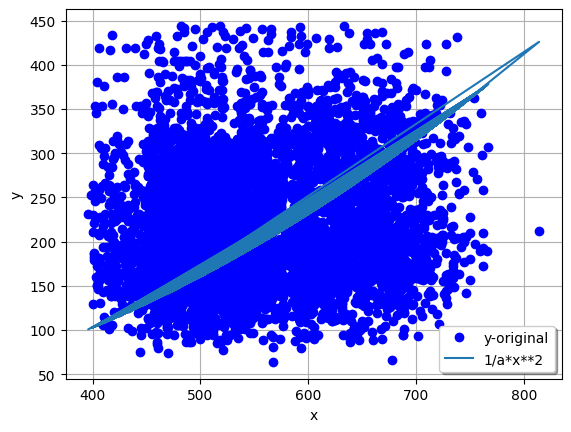

In [258]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [259]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -0.6216769164159597
La raiz del coefiente es:  0.7884649113409928


In [260]:
df_cor.loc[9] = ['Score_buro', 'Modelo 10', round(R2,2), round(corr,2)]

#Variable 3: porc_eng

##Modelo 11

In [261]:
Vars_Indep= df1[['porc_eng']]
Var_Dep= df1['monto_accesorios']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b):
     return a*np.sin(x) + b

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['porc_eng'], df1['monto_accesorios'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['porc_eng'], df1['monto_accesorios'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.sin(x) + b

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [-5.e-324  0.e+000]
Las predicciones son: 


,porc_eng
7243,0.000000e+00
7247,4.940656e-324
7250,0.000000e+00
7254,0.000000e+00
7255,4.940656e-324
...,...
22721,-4.940656e-324
22722,4.940656e-324
22727,0.000000e+00
22731,4.940656e-324


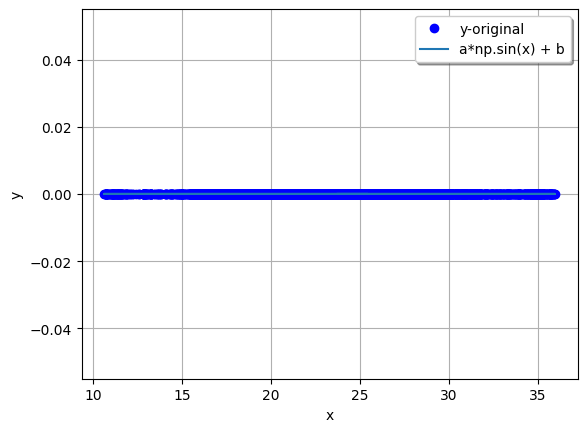

In [262]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.sin(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [263]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  1.0
La raiz del coefiente es:  1.0


In [264]:
df_cor.loc[10] = ['Porc_eng', 'Modelo 11', round(R2,2), round(corr,2)]

##Modelo 12: Función exponencial

In [265]:
Vars_Indep= df1[['porc_eng']]
Var_Dep= df1['status']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b,c):
     return a**(b*x) + c

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['porc_eng'], df1['status'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['porc_eng'], df1['status'])
a, b,c= parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a**(b*x) + c

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [1.00163328 0.96591468 0.08782663]
Las predicciones son: 


,porc_eng
7243,1.128661
7247,1.115197
7250,1.132705
7254,1.118538
7255,1.115537
...,...
22721,1.129203
22722,1.105943
22727,1.128022
22731,1.135410


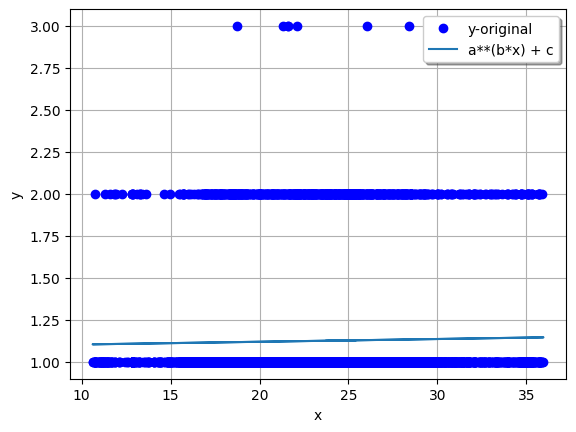

In [266]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a**(b*x) + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [267]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  0.0004772112938650208
La raiz del coefiente es:  0.02184516637302222


In [268]:
df_cor.loc[11] = ['Porc_eng', 'Modelo 12', round(R2,2), round(corr,2)]

##Modelo 13: Función invers

In [269]:
Vars_Indep= df1[['porc_eng']]
Var_Dep= df1['riesgo']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b):
     return 1/a*x

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['porc_eng'], df1['riesgo'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['porc_eng'], df1['riesgo'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 = 1/a*x

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [2.80201325 1.        ]
Las predicciones son: 


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


,porc_eng
7243,9.061342
7247,6.113461
7250,9.939282
7254,6.848647
7255,6.188408
...,...
22721,9.179114
22722,4.064934
22727,8.922156
22731,10.524576


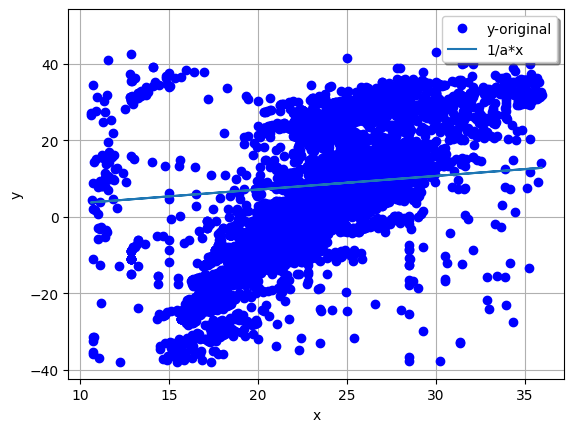

In [270]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [271]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  0.1043380153343757
La raiz del coefiente es:  0.32301395532449634


In [272]:
df_cor.loc[12] = ['Porc_eng', 'Modelo 13', round(R2,2), round(corr,2)]

##Modelo 14: Función tangencial

In [273]:
Vars_Indep= df1[['edad_cliente']]
Var_Dep= df1['porc_eng']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b):
     return a*np.tan(x) + b

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['edad_cliente'], df1['porc_eng'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['edad_cliente'], df1['porc_eng'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.tan(x) + b

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [-1.43392359e-03  2.33757812e+01]
Las predicciones son: 


,edad_cliente
7243,23.376185
7247,23.377930
7250,23.375336
7254,23.374509
7255,23.374509
...,...
22721,23.375322
22722,23.372496
22727,23.374509
22731,23.380475


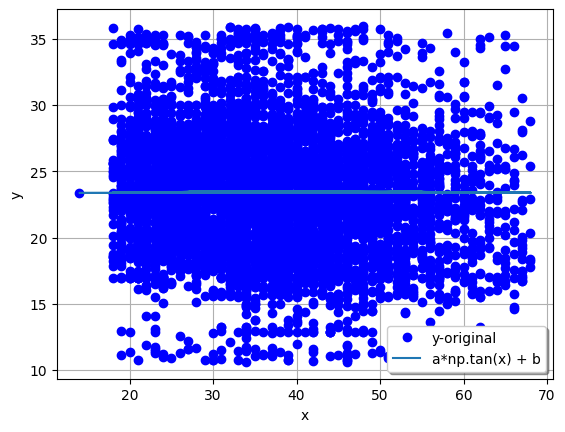

In [274]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [275]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  2.1521378424482762e-05
La raiz del coefiente es:  0.004639113969766507


In [276]:
df_cor.loc[13] = ['Porc_eng', 'Modelo 14', round(R2,2), round(corr,2)]

##Modelo 15: Función cuadrática inversa

In [277]:
Vars_Indep= df1[['porc_eng']]
Var_Dep= df1['folio_solicitud']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b):
     return  1/a*x**2

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['porc_eng'], df1['folio_solicitud'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['porc_eng'], df1['folio_solicitud'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 =  1/a*x**2

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1

Los parámetros son:  [0.01056541 1.        ]
Las predicciones son: 


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


,porc_eng
7243,61015.359124
7247,27773.364631
7250,73411.512011
7254,34854.890244
7255,28458.496783
...,...
22721,62611.729246
22722,12278.949640
22727,59155.317190
22731,82312.030500


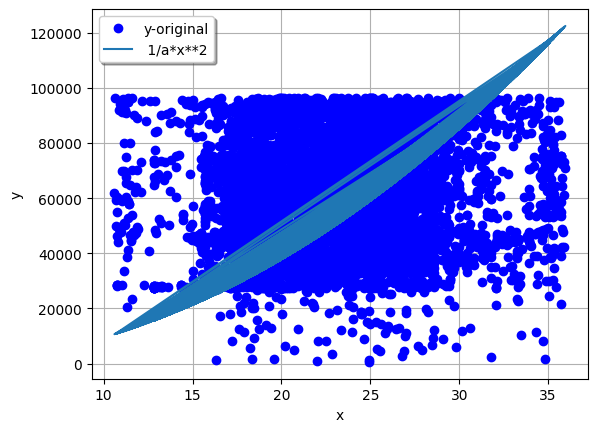

In [278]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label=" 1/a*x**2")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [279]:
#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)

El coeficiente de correlación es:  -1.1457786277718092
La raiz del coefiente es:  1.0704104949839615


In [280]:
df_cor.loc[14] = ['Porc_eng', 'Modelo 15', round(R2,2), round(corr,2)]

#Variable 4: limite_crédito

##Modelo 16

In [287]:
"""Vars_Indep= df1[['limite_credito']]
Var_Dep= df1['score_buro']

x= Vars_Indep
y= Var_Dep

def  func1 (x, a, b,c):
     return  a*x**2 + b*x + c

#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['limite_credito'], df1['score_buro'])

#Obtenemos los coeficientes del modelo de regresión no lineal
print("Los parámetros son: ", \
      parametros)

#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['limite_credito'], df1['score_buro'])
a, b,c= parametros[ 0 ], parametros[ 1 ],  parametros[ 2 ]
yfit1 =  a*x**2 + b*x + c

#Calculamos las predicciones y reestructuramos el vector de predicciones
print("Las predicciones son: ")
yfit1"""

'Vars_Indep= df1[[\'limite_credito\']]\nVar_Dep= df1[\'score_buro\']\n\nx= Vars_Indep\ny= Var_Dep\n\ndef  func1 (x, a, b,c):\n     return  a*x**2 + b*x + c\n\n#Ajustamos los parámetros de la función curve_fit\nparametros, covs= curve_fit(func1, df1[\'limite_credito\'], df1[\'score_buro\'])\n\n#Obtenemos los coeficientes del modelo de regresión no lineal\nprint("Los parámetros son: ",       parametros)\n\n#Creamos el modelo de predicción con los parámetros obtenidos\nparametros, _ = curve_fit(func1, df1[\'limite_credito\'], df1[\'score_buro\'])\na, b,c= parametros[ 0 ], parametros[ 1 ],  parametros[ 2 ]\nyfit1 =  a*x**2 + b*x + c\n\n#Calculamos las predicciones y reestructuramos el vector de predicciones\nprint("Las predicciones son: ")\nyfit1'

In [282]:
"""#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x**2 + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()"""

'#Graficamos las predicciones y los datos originales para realizar la comparación\nplt.plot(x, y, \'bo\', label="y-original")\nplt.plot(x, yfit1, label="a*x**2 + b*x + c")\nplt.xlabel(\'x\')\nplt.ylabel(\'y\')\nplt.legend(loc=\'best\', fancybox=True, shadow=True)\nplt.grid(True)\nplt.show()'

In [283]:
"""#Calculamos el coeficiente de determinación del modelo
R2 = r2_score(y, yfit1)
print("El coeficiente de correlación es: ", R2)
corr= np.sqrt(abs(R2))
print("La raiz del coefiente es: ",corr)"""

'#Calculamos el coeficiente de determinación del modelo\nR2 = r2_score(y, yfit1)\nprint("El coeficiente de correlación es: ", R2)\ncorr= np.sqrt(abs(R2))\nprint("La raiz del coefiente es: ",corr)'

In [284]:
df_cor

,Variable,Modelo,Determinación,Correlación
0,Riesgo,Modelo 1,8.400000e-01,9.200000e-01
1,Riesgo,Modelo 2,-4.000000e-02,1.900000e-01
2,Riesgo,Modelo 3,1.000000e+00,1.000000e+00
3,Riesgo,Modelo 4,-4.708000e+01,6.860000e+00
4,Riesgo,Modelo 5,-8.000000e-01,9.000000e-01
5,Score_buro,Modelo 6,-1.813571e+61,4.258604e+30
6,Score_buro,Modelo 7,2.000000e-02,1.300000e-01
7,Score_buro,Modelo 8,-1.500000e-01,3.900000e-01
8,Score_buro,Modelo 9,1.000000e+00,1.000000e+00
9,Score_buro,Modelo 10,-6.200000e-01,7.900000e-01
